In [1]:
# if hit plotting library issues, try resetting LD path for julia
# can set in ~/.local/share/jupyter/kernels/
haskey(ENV, "LD_LIBRARY_PATH") && @assert ENV["LD_LIBRARY_PATH"] == ""
import Pkg
pkgs = [
    "Revise",
    "FASTX",
    "BioSequences",
    "Kmers",
    "Graphs",
    "MetaGraphs",
    "SparseArrays",
    "ProgressMeter",
    "Distributions",
    "HiddenMarkovModels",
    "BioAlignments",
    "StatsBase",
    "Random",
    "StatsPlots",
    "Statistics",
    # "GraphMakie",
    "IterTools",
    "Primes",
    "OnlineStats",
    "IteratorSampling",
    "HypothesisTests",
    "Clustering",
    "Distances",
    "BioAlignments",
    "Statistics"
]
# Pkg.add(pkgs)
for pkg in pkgs
    eval(Meta.parse("import $pkg"))
end
# Pkg.develop(path="/global/cfs/projectdirs/m4269/cjprybol/Mycelia")
# Pkg.develop(path="../../..")
import Mycelia

┌ Warning: The active manifest file is an older format with no julia version entry. Dependencies may have been resolved with a different julia version.
└ @ /global/cfs/cdirs/m4269/cjprybol/Mycelia/Manifest.toml:0
[ Info: Precompiling Mycelia [453d265d-8292-4a7b-a57c-dce3f9ae6acd]
[ Info: Skipping precompilation since __precompile__(false). Importing Mycelia [453d265d-8292-4a7b-a57c-dce3f9ae6acd].


In [2]:
PROJECT_BASEDIR = dirname(pwd())
data_dir = joinpath(PROJECT_BASEDIR, "data")
genome_dir = mkpath(joinpath(data_dir, "genomes"))

"/global/cfs/cdirs/m4269/cjprybol/Mycelia/projects/variant-calling-benchmarking/data/genomes"

In [3]:
working_dir = joinpath(data_dir, "test")
mkpath(working_dir)

"/global/cfs/cdirs/m4269/cjprybol/Mycelia/projects/variant-calling-benchmarking/data/test"

In [4]:
# short_read_sets = unique(map(x -> match(r"^(.+\.\d+x)\.", x).captures[1], filter(x -> occursin(r"\.fna\.art", x) && occursin(r"\.fq\.gz", x) && !occursin("trimming_report", x) && !occursin("_val_", x), sort(readdir(genome_dir, join=true), by=x->filesize(x)))))
# # forward = short_read_set * ".1_val_1.fq.gz"
# # reverse = short_read_set * ".2_val_2.fq.gz"

In [5]:
long_read_fastqs = sort(filter(x -> occursin(r"\.filtlong\.fq\.gz$", x), readdir(genome_dir, join=true)), by=x->filesize(x))
fastq = long_read_fastqs[1]

"/global/cfs/cdirs/m4269/cjprybol/Mycelia/projects/variant-calling-benchmarking/data/genomes/fF3EHHs.fna.normalized.vcf.fna.badread.10x.filtlong.fq.gz"

In [6]:
# reference_fasta = replace(fastq, r"\.badread.*" => "")

In [7]:
function find_resampling_stretches(;record_kmer_solidity, solid_branching_kmer_indices)
    indices = findall(.!record_kmer_solidity)  # Find the indices of false values
    if isempty(indices)
        return UnitRange{Int64}[]
    end
    
    diffs = diff(indices)  # Calculate the differences between consecutive indices
    # @show diffs
    range_starts = [indices[1]]  # Start with the first false index
    range_ends = Int[]
    
    for (i, d) in enumerate(diffs)
        if d > 1
            push!(range_ends, indices[i])
            push!(range_starts, indices[i+1])
        end
    end
    
    push!(range_ends, indices[end])  # Add the last false index as a range end
    
    low_quality_runs = [(start, stop) for (start, stop) in zip(range_starts, range_ends)]
    
    resampling_stretches = UnitRange{Int64}[]
    
    for low_quality_run in low_quality_runs
        unders = filter(solid_branching_kmer -> solid_branching_kmer < first(low_quality_run), solid_branching_kmer_indices)
        overs = filter(solid_branching_kmer -> solid_branching_kmer > last(low_quality_run), solid_branching_kmer_indices)
        if isempty(overs) || isempty(unders)
            continue
        else
            nearest_under = maximum(unders)
            nearest_over = minimum(overs)
            push!(resampling_stretches, nearest_under:nearest_over)
        end
    end
    if !allunique(resampling_stretches)
        resampling_stretches = unique!(resampling_stretches)
    end
    return resampling_stretches
end

find_resampling_stretches (generic function with 1 method)

In [8]:
function fastq_record(;identifier, sequence, quality_scores)
    # Fastx wont parse anything higher than 93
    quality_scores = min.(quality_scores, 93)
    record_string = join(["@" * identifier, sequence, "+", join([Char(x+33) for x in quality_scores])], "\n")
    return FASTX.parse(FASTX.FASTQRecord, record_string)
end

fastq_record (generic function with 1 method)

In [9]:
function process_fastq_record(;record, graph, likely_valid_kmers, kmer_to_index_map, branching_nodes_set, assembly_k, transition_likelihoods, kmer_mean_quality, yen_k_shortest_paths_and_weights, kmer_total_quality, ordered_kmers, yen_k=7)
    new_record_identifier = FASTX.identifier(record) * ".k$(assembly_k)"
    record_sequence = BioSequences.LongDNA{4}(FASTX.sequence(record))

    kmer_type = Kmers.DNAKmer{assembly_k}
    # record_kmers = last.(collect(Kmers.EveryKmer{Kmers.DNAKmer{assembly_k, Int(ceil(assembly_k / 31))}}(record_sequence)))
    record_kmers = last.(collect(Kmers.EveryKmer{kmer_type}(record_sequence)))
    record_quality_scores = collect(FASTX.quality_scores(record))
    record_kmer_quality_scores = [record_quality_scores[i:i+assembly_k-1] for i in 1:length(record_quality_scores)-assembly_k+1]
    
    record_kmer_solidity = map(kmer -> kmer in likely_valid_kmers, record_kmers)
    record_branching_kmers = [kmer_to_index_map[kmer] in branching_nodes_set for kmer in record_kmers]
    record_solid_branching_kmers = record_kmer_solidity .& record_branching_kmers
    
    # trim beginning of fastq
    initial_solid_kmer = findfirst(record_kmer_solidity)
    if isnothing(initial_solid_kmer)
        return record
    elseif initial_solid_kmer > 1
        record_kmers = record_kmers[initial_solid_kmer:end]
        record_kmer_quality_scores = record_kmer_quality_scores[initial_solid_kmer:end]
        record_kmer_solidity = map(kmer -> kmer in likely_valid_kmers, record_kmers)
        record_branching_kmers = [kmer_to_index_map[kmer] in branching_nodes_set for kmer in record_kmers]
        record_solid_branching_kmers = record_kmer_solidity .& record_branching_kmers
    end
    initial_solid_kmer = 1
    
    # trim end of fastq
    last_solid_kmer = findlast(record_kmer_solidity)
    if last_solid_kmer != length(record_kmer_solidity)
        record_kmers = record_kmers[1:last_solid_kmer]
        record_kmer_quality_scores = record_kmer_quality_scores[1:last_solid_kmer]
        record_kmer_solidity = map(kmer -> kmer in likely_valid_kmers, record_kmers)
        record_branching_kmers = [kmer_to_index_map[kmer] in branching_nodes_set for kmer in record_kmers]
        record_solid_branching_kmers = record_kmer_solidity .& record_branching_kmers
    end
    
    # identify low quality runs and the solid branchpoints we will use for resampling
    # low_quality_runs = find_false_ranges(record_kmer_solidity)
    solid_branching_kmer_indices = findall(record_solid_branching_kmers)
    resampling_stretches = find_resampling_stretches(;record_kmer_solidity, solid_branching_kmer_indices)

    # nothing to do
    if isempty(resampling_stretches)
        return record
    end
    trusted_range = 1:max(first(first(resampling_stretches))-1, 1)
    
    new_record_kmers = record_kmers[trusted_range]
    new_record_kmer_qualities = record_kmer_quality_scores[trusted_range]
    
    
    for (i, resampling_stretch) in enumerate(resampling_stretches)
        starting_solid_kmer = record_kmers[first(resampling_stretch)]
        ending_solid_kmer = record_kmers[last(resampling_stretch)]
        
        current_quality_scores = record_quality_scores[resampling_stretch]
        u = kmer_to_index_map[starting_solid_kmer]
        v = kmer_to_index_map[ending_solid_kmer]
        if !haskey(yen_k_shortest_paths_and_weights, u => v)
            yen_k_result = Graphs.yen_k_shortest_paths(graph, u, v, Graphs.weights(graph), yen_k)
            yen_k_shortest_paths_and_weights[u => v] = Vector{Pair{Vector{Int}, Float64}}()
            for path in yen_k_result.paths
                path_weight = Statistics.mean([kmer_total_quality[ordered_kmers[node]] for node in path])
                path_transition_likelihoods = 1.0
                for (a, b) in zip(path[1:end-1], path[2:end])
                    path_transition_likelihoods *= transition_likelihoods[a, b]
                end
                joint_weight = path_weight * path_transition_likelihoods
                push!(yen_k_shortest_paths_and_weights[u => v], path => joint_weight)
            end
        end
        yen_k_path_weights = yen_k_shortest_paths_and_weights[u => v]      
        if length(yen_k_path_weights) > 1
            current_distance = length(resampling_stretch)
            initial_weights = last.(yen_k_path_weights)
            path_lengths = length.(first.(yen_k_path_weights))
            deltas = map(l -> abs(l-current_distance), path_lengths)
            adjusted_weights = initial_weights .* map(d -> exp(-d * log(2)), deltas)
            
            # and a bonus for usually being correct
            
            selected_path_index = StatsBase.sample(StatsBase.weights(adjusted_weights))
            selected_path, selected_path_weights = yen_k_path_weights[selected_path_index]
            selected_path_kmers = [ordered_kmers[kmer_index] for kmer_index in selected_path]
            
            if last(new_record_kmers) == first(selected_path_kmers)
                selected_path_kmers = selected_path_kmers[2:end]
            end
            append!(new_record_kmers, selected_path_kmers)
            selected_kmer_qualities = [Int8.(min.(typemax(Int8), floor.(kmer_mean_quality[kmer]))) for kmer in selected_path_kmers]
            append!(new_record_kmer_qualities, selected_kmer_qualities)
        else
            selected_path_kmers = record_kmers[resampling_stretch]
            if last(new_record_kmers) == first(selected_path_kmers)
                selected_path_kmers = selected_path_kmers[2:end]
            end
            append!(new_record_kmers, selected_path_kmers)
            selected_kmer_qualities = [Int8.(min.(typemax(Int8), floor.(kmer_mean_quality[kmer]))) for kmer in selected_path_kmers]
            append!(new_record_kmer_qualities, selected_kmer_qualities)
        end
        if i < length(resampling_stretches) # append high quality gap
            next_solid_start = last(resampling_stretch)+1
            next_resampling_stretch = resampling_stretches[i+1]
            next_solid_stop = first(next_resampling_stretch)-1
            if !isempty(next_solid_start:next_solid_stop)
                selected_path_kmers = record_kmers[next_solid_start:next_solid_stop]
                append!(new_record_kmers, selected_path_kmers)
                selected_kmer_qualities = record_kmer_quality_scores[next_solid_start:next_solid_stop]
                append!(new_record_kmer_qualities, selected_kmer_qualities)
            end
        else # append remainder of sequence
            @assert i == length(resampling_stretches)
            next_solid_start = last(resampling_stretch)+1
            if next_solid_start < length(record_kmers)
                selected_path_kmers = record_kmers[next_solid_start:end]
                append!(new_record_kmers, selected_path_kmers)
                selected_kmer_qualities = record_kmer_quality_scores[next_solid_start:end]
                append!(new_record_kmer_qualities, selected_kmer_qualities)
            end
        end
    end
    
    for (a, b) in zip(new_record_kmers[1:end-1], new_record_kmers[2:end])
        @assert a != b
    end
    new_record_sequence = Mycelia.kmer_path_to_sequence(new_record_kmers)
    new_record_quality_scores = new_record_kmer_qualities[1]
    for new_record_kmer_quality in new_record_kmer_qualities[2:end]
        push!(new_record_quality_scores, last(new_record_kmer_quality))
    end
    new_record = fastq_record(identifier=new_record_identifier, sequence=new_record_sequence, quality_scores=new_record_quality_scores)
    # @assert FASTX.sequence(new_record) == string(new_record_sequence)
    # @assert collect(FASTX.quality_scores(new_record)) == new_record_quality_scores
    # BioAlignments.pairalign(BioAlignments.LevenshteinDistance(), FASTX.sequence(record), FASTX.sequence(new_record))
    return new_record
end

process_fastq_record (generic function with 1 method)

In [10]:
function polish_fastq(;fastq, k=1)
    # @show k
    # @show fastq
    if k == 1
        assembly_k = Mycelia.assess_dnamer_saturation([fastq])
    else
        assembly_k = k
    end
    fastq_out = replace(fastq, Mycelia.FASTQ_REGEX => ".k$(assembly_k).fq")
    # kmer_type = Kmers.DNAKmer{assembly_k, Int(ceil(assembly_k / 31))}
    kmer_type = Kmers.DNAKmer{assembly_k}
    records = collect(Mycelia.open_fastx(fastq))

    read_quality_scores = [collect(FASTX.quality_scores(record)) for record in records]

    # make a dictionary associating all kmers with their quality scores
    all_kmer_quality_support = Dict{kmer_type, Vector{Float64}}()
    for record in records
        record_quality_scores = collect(FASTX.quality_scores(record))
        record_quality_score_slices = [record_quality_scores[i:i+assembly_k-1] for i in 1:length(record_quality_scores)-assembly_k+1]
        sequence = BioSequences.LongDNA{2}(FASTX.sequence(record))
        for ((i, kmer), kmer_base_qualities) in zip(Kmers.EveryKmer{kmer_type}(sequence), record_quality_score_slices)
            if haskey(all_kmer_quality_support, kmer)
                all_kmer_quality_support[kmer] = all_kmer_quality_support[kmer] .+ kmer_base_qualities
            else
                all_kmer_quality_support[kmer] = kmer_base_qualities
            end
        end
    end

    kmer_counts = Mycelia.count_kmers(kmer_type, fastq)
    kmer_indices = Dict(kmer => i for (i, kmer) in enumerate(keys(kmer_counts)))
    canonical_kmer_counts = Mycelia.count_canonical_kmers(kmer_type, fastq)
    canonical_kmer_indices = Dict(kmer => i for (i, kmer) in enumerate(keys(canonical_kmer_counts)))

    strand_normalized_quality_support = Dict{kmer_type, Vector{Float64}}()
    for (kmer, support) in all_kmer_quality_support
        strand_normalized_quality_support[kmer] = support
        if haskey(all_kmer_quality_support, BioSequences.reverse_complement(kmer))
            strand_normalized_quality_support[kmer] .+= all_kmer_quality_support[BioSequences.reverse_complement(kmer)]
        end
    end
    strand_normalized_quality_support
    
    ordered_kmers = collect(keys(kmer_counts))
    
    kmer_mean_quality = Dict(kmer => strand_normalized_quality_support[kmer] ./ canonical_kmer_counts[BioSequences.canonical(kmer)] for kmer in ordered_kmers)
    
    kmer_total_quality = Dict(kmer => sum(quality_values) for (kmer, quality_values) in strand_normalized_quality_support)
    # state_likelihoods = Dict(kmer => kmer_count / total_kmers for (kmer, kmer_count) in kmer_counts)
    state_likelihoods = Dict(kmer => total_quality / sum(values(kmer_total_quality)) for (kmer, total_quality) in kmer_total_quality)

    total_states = length(state_likelihoods)

    transition_likelihoods = SparseArrays.spzeros(total_states, total_states)
    for record in records
        sequence = BioSequences.LongDNA{4}(FASTX.sequence(record))
        sources = Kmers.EveryKmer{kmer_type}(sequence[1:end-1])
        destinations = Kmers.EveryKmer{kmer_type}(sequence[2:end])
        for ((source_i, source), (destination_i, destination)) in zip(sources, destinations)
            source_index = kmer_indices[source]
            destination_index = kmer_indices[destination]
            transition_likelihoods[source_index, destination_index] += 1
        end
    end
    for source in 1:total_states
        # @show source
        outgoing_transition_counts = transition_likelihoods[source, :]
        if sum(outgoing_transition_counts) > 0
            transition_likelihoods[source, :] .= transition_likelihoods[source, :] ./ sum(transition_likelihoods[source, :]) 
        end
    end
    transition_likelihoods

    graph = Graphs.SimpleDiGraph(total_states)
    row_indices, column_indices, cell_values = SparseArrays.findnz(transition_likelihoods)
    for (row, col) in zip(row_indices, column_indices)
        Graphs.add_edge!(graph, row, col)
    end

    unbranching_nodes = Set(Int[])
    for node in Graphs.vertices(graph)
        if (Graphs.indegree(graph, node) <= 1) && (Graphs.outdegree(graph, node) <= 1)
            push!(unbranching_nodes, node)
        end
    end
    branching_nodes = setdiff(Graphs.vertices(graph), unbranching_nodes)
    branching_nodes_set = Set(branching_nodes)
    
    total_strand_normalized_quality_support = sum.(collect(values(strand_normalized_quality_support)))
    # minimum_average = min(Statistics.mean(total_strand_normalized_quality_support), Statistics.median(total_strand_normalized_quality_support))
    mean_total_support = Statistics.mean(total_strand_normalized_quality_support)
    Statistics.std(total_strand_normalized_quality_support)
    # test_is_single_distribution = HypothesisTests.ExactOneSampleKSTest(total_strand_normalized_quality_support, Distributions.Normal())
    # if HypothesisTests.pvalue(test_is_single_distribution) < 1e-3
    #     @info "p = $(HypothesisTests.pvalue(test_is_single_distribution)) rejecting error-free hypothesis & entering error correction"
    # else
    #     @info "single distribution detected, this data may be error-free"
    #     # return fastq
    #     return (fastq = fastq, k = missing)
    # end
    
    sorted_kmer_total_quality = sort(kmer_total_quality)
    sorted_kmer_total_quality_values = collect(values(sorted_kmer_total_quality))
    
    mean_quality_value = Statistics.mean(sorted_kmer_total_quality_values)
    # std_quality_value = Statistics.std(sorted_kmer_total_quality_values)
    # if mean_quality_value-2std_quality_value > 0
    #     threshold = mean_quality_value - std_quality_value
    # else
    threshold = mean_quality_value
    # end
    # if mean_quality_value-std_quality_value > 0
    # if (mean_quality_value - std_quality_value) > 0
    #     threshold = mean_quality_value
    #     threshold_label = "mean"
    # elseif (mean_quality_value - 2std_quality_value) > 0
    #     threshold = mean_quality_value - std_quality_value
    #     threshold_label = "mean-1σ"
    #     # @info "skipping correction"
    #     # return (fastq = fastq, k = missing)
    # end
    
    # threshold = mean_quality_value

    xs = [
        [i for (i, y) in enumerate(sorted_kmer_total_quality_values) if y > threshold],
        [i for (i, y) in enumerate(sorted_kmer_total_quality_values) if y <= threshold]
        ]
    ys = [
        [y for y in sorted_kmer_total_quality_values if y > threshold],
        [y for y in sorted_kmer_total_quality_values if y <= threshold]
    ]
    # sorted_kmer_total_quality_values 
    
    p = StatsPlots.scatter(
        xs,
        ys,
        title = "kmer qualities",
        ylabel = "canonical kmer cumulative QUAL value",
        label = ["above" "below"],
        legend = :outertopright,
        size = (900, 500),
        margins=10StatsPlots.Plots.PlotMeasures.mm,
        xticks = false
    )
    p = StatsPlots.hline!(p, [mean_quality_value], label="mean")
    # if mean_quality_value-std_quality_value > 0
    #     p = StatsPlots.hline!(p, [mean_quality_value-std_quality_value], label="mean-σ")
    # end
    # if mean_quality_value-2std_quality_value > 0
    #     p = StatsPlots.hline!(p, [mean_quality_value-2std_quality_value], label="mean-2σ")
    # end
    # if mean_quality_value-3std_quality_value > 0
    #     p = StatsPlots.hline!(p, [mean_quality_value-3std_quality_value], label="mean-3σ")
    # end
    display(p)
    
    
    # BEING FLAGGED DOESN'T AUTOMATICALLY MEAN THAT WE WILL DROP IT, IT JUST MEANS THAT WE WILL ATTEMPT TO RESAMPLE IT
    # clustering_k = 2
    # clustering_result = Clustering.kmeans(permutedims(sorted_kmer_total_quality_values), clustering_k)

    # assignments = Clustering.assignments(clustering_result)
    # centroids = clustering_result.centers

#     min_cluster_result = findmin(centroids)
#     smaller_cluster = last(last(min_cluster_result).I)
    
#     ys = [Float64[] for i in 1:clustering_k]
#     xs = [Int[] for i in 1:clustering_k]
#     for (i, (assignment, value)) in enumerate(zip(assignments, sorted_kmer_total_quality_values))
#         # if assignment == 1
#         push!(ys[assignment], value)
#         push!(xs[assignment], i)
#     end
#     # group_values
#     label = smaller_cluster == 1 ? ["likely sequencing artifacts" "likely valid kmers"] : ["likely valid kmers" "likely sequencing artifacts"]

#     p = StatsPlots.scatter(
#         xs,
#         ys,
#         title = "kmeans error separation",
#         ylabel = "canonical kmer cumulative QUAL value",
#         label = label,
#         legend = :outertopright,
#         size = (900, 500),
#         margins=10StatsPlots.Plots.PlotMeasures.mm,
#         xticks = false
#     )
#     display(p)
    
    
    # likely_sequencing_artifact_indices = xs[smaller_cluster]
    likely_valid_kmer_indices = xs[1]
    likely_sequencing_artifact_indices = xs[2]
    likely_sequencing_artifact_kmers = Set(ordered_kmers[likely_sequencing_artifact_indices])
    likely_valid_kmers = Set(ordered_kmers[likely_valid_kmer_indices])
    kmer_to_index_map = Dict(kmer => i for (i, kmer) in enumerate(ordered_kmers))
    
    # 2:24 renewing yenk weights each time
    # 2:22 sharing yenk weights
    revised_records = []
    ProgressMeter.@showprogress for record in records
        yen_k_shortest_paths_and_weights = Dict{Pair{Int, Int}, Vector{Pair{Vector{Int}, Float64}}}()
        revised_record = process_fastq_record(;record, graph, likely_valid_kmers, kmer_to_index_map, branching_nodes_set, assembly_k, kmer_mean_quality, transition_likelihoods, yen_k_shortest_paths_and_weights, kmer_total_quality, ordered_kmers)
        push!(revised_records, revised_record)
    end
    
    open(fastq_out, "w") do io
        fastx_io = FASTX.FASTQ.Writer(io)
        for record in revised_records
            write(fastx_io, record)
        end
        close(fastx_io)
    end
    run(`gzip --force $(fastq_out)`)
    return (fastq = fastq_out * ".gz", k=assembly_k)
end

polish_fastq (generic function with 1 method)

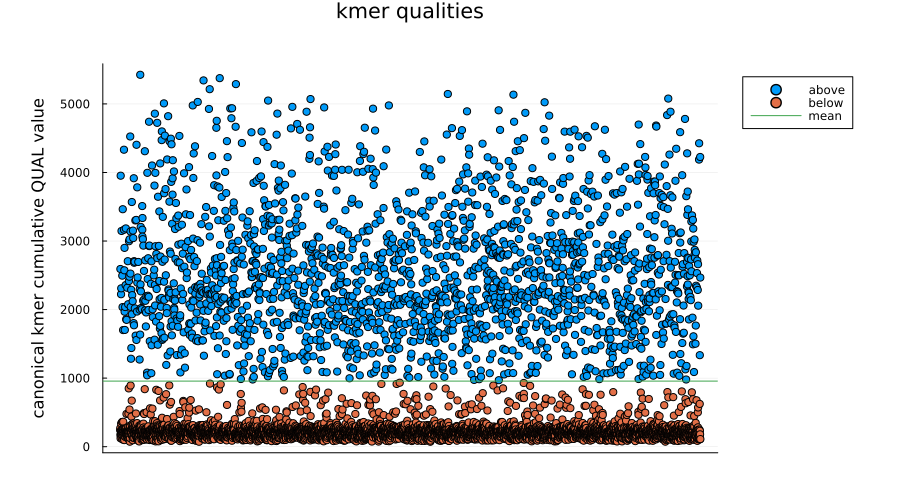

Progress: 100%|█████████████████████████████████████████| Time: 0:02:04


next_k = 13


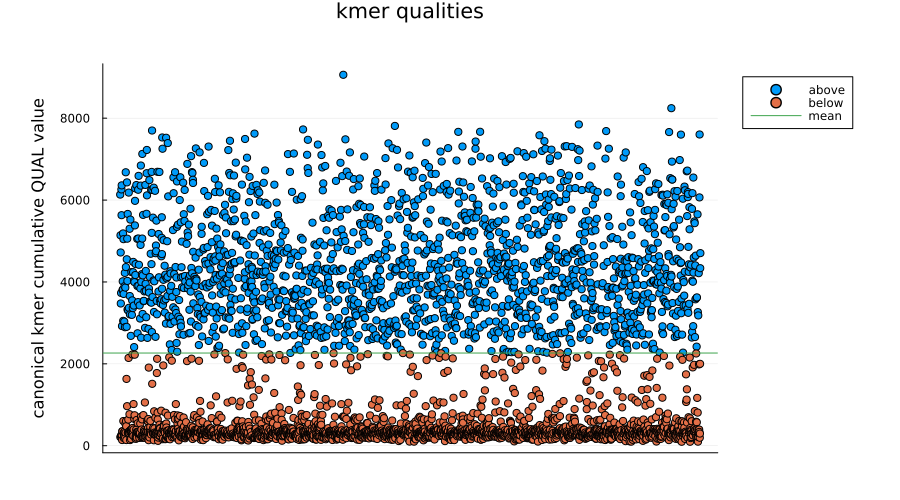

Progress: 100%|█████████████████████████████████████████| Time: 0:00:09


next_k = 17


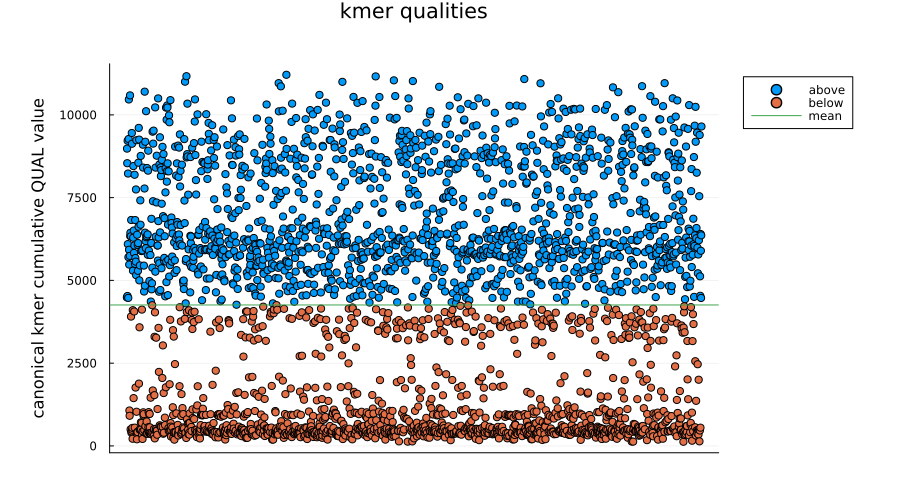

Progress: 100%|█████████████████████████████████████████| Time: 0:00:03


next_k = 19


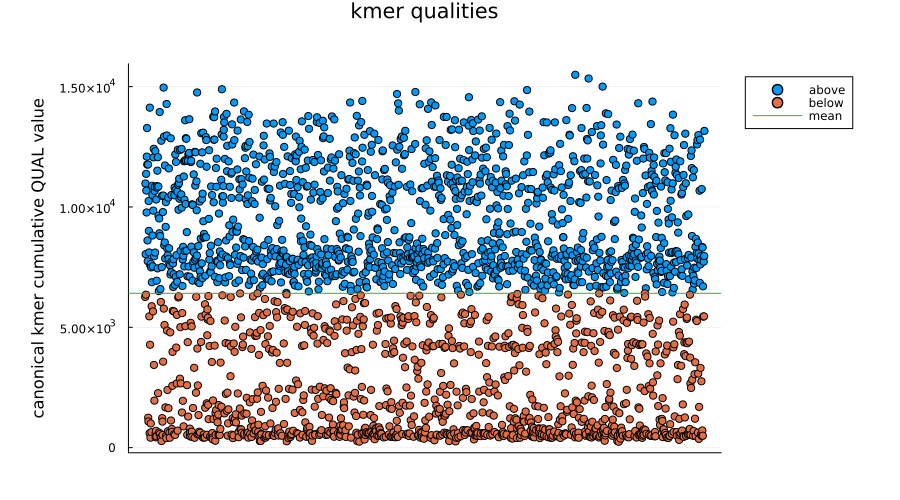

Progress: 100%|█████████████████████████████████████████| Time: 0:00:02


next_k = 23


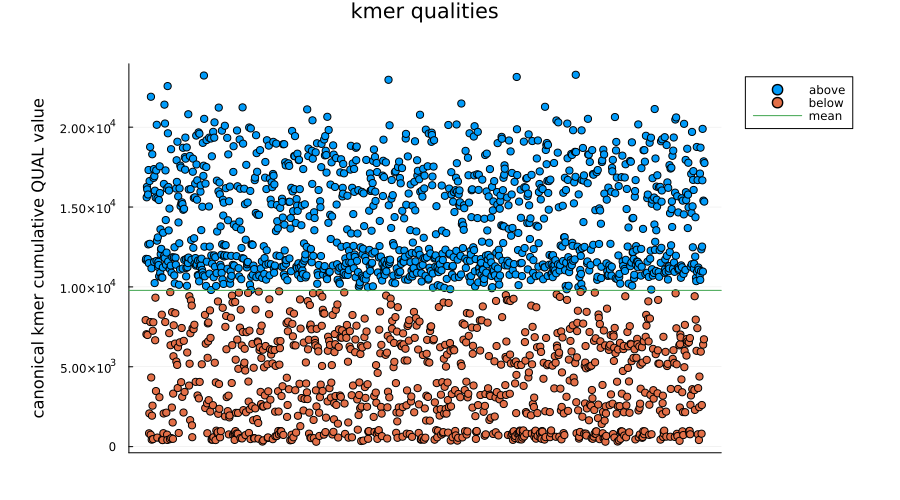

Progress: 100%|█████████████████████████████████████████| Time: 0:00:01


next_k = 31


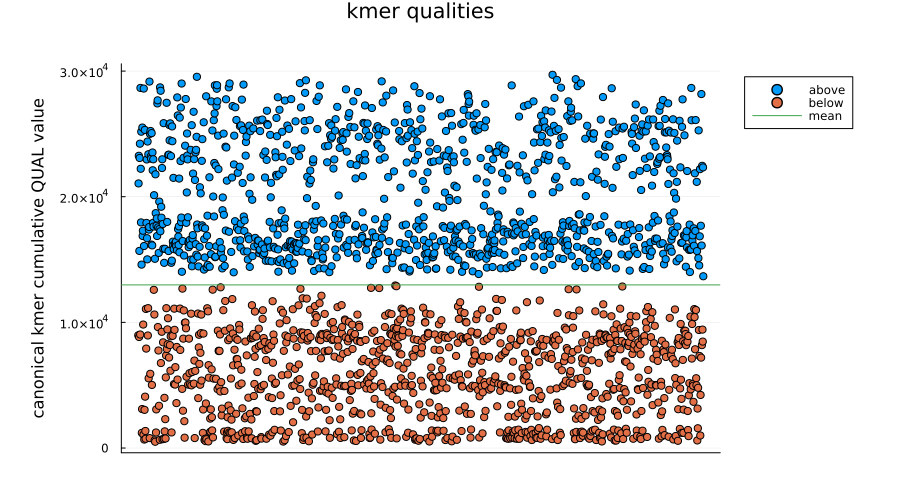

Progress: 100%|█████████████████████████████████████████| Time: 0:00:01


next_k = 53


In [ ]:
# max_k = maximum(Mycelia.ks())
# this is polishing up to the ~ strain level separation boundary
max_k = 53
polishing_results = [polish_fastq(;fastq, k=11)]
# @show last(polishing_results)
while (!ismissing(last(polishing_results).k)) && (last(polishing_results).k < max_k)
    next_k = first(filter(k -> k > last(polishing_results).k, Mycelia.ks()))
    @show next_k
    push!(polishing_results, polish_fastq(fastq=last(polishing_results).fastq, k=next_k))
end

In [ ]:
# finish updating all reads for all k rounds

In [ ]:
# write out final assembly

In [ ]:
# call variants

In [ ]:
# assess accuracy